

Ultralytics YOLOv8 is the latest version of the YOLO (You Only Look Once) object detection and image segmentation model developed by Ultralytics. The YOLOv8 model is designed to be fast, accurate, and easy to use, making it an excellent choice for a wide range of object detection and image segmentation tasks. It can be trained on large datasets and is capable of running on a variety of hardware platforms, from CPUs to GPUs.



If you notice that our notebook behaves incorrectly - especially if you experience errors that prevent you from going through the tutorial - don't hesitate! Let us know and open an [issue](https://github.com/roboflow/notebooks/issues) on the Roboflow Notebooks repository.

## Accompanying Blog Post

We recommend that you follow along in this notebook while reading the blog post on how to train YOLOv8 Object Detection, concurrently.

## Pro Tip: Use GPU Acceleration

If you are running this notebook in Google Colab, navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`. This will ensure your notebook uses a GPU, which will significantly speed up model training times.

## Steps in this Tutorial

In this tutorial, we are going to cover:

- Before you start
- Install YOLOv8
- CLI Basics
- Inference with Pre-trained COCO Model
- Roboflow Universe
- Preparing a custom dataset
- Custom Training
- Validate Custom Model
- Inference with Custom Model

**Let's begin!**

## Before you start

Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`.

In [1]:
!nvidia-smi

Tue Apr  2 18:28:20 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   35C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [2]:
import os
HOME = os.getcwd()
print(HOME)

/content


## Install YOLOv8

⚠️ YOLOv8 is still under heavy development. Breaking changes are being introduced almost weekly. We strive to make our YOLOv8 notebooks work with the latest version of the library. Last tests took place on **03.01.2024** with version **YOLOv8.0.196**.

If you notice that our notebook behaves incorrectly - especially if you experience errors that prevent you from going through the tutorial - don't hesitate! Let us know and open an [issue](https://github.com/roboflow/notebooks/issues) on the Roboflow Notebooks repository.

YOLOv8 can be installed in two ways - from the source and via pip. This is because it is the first iteration of YOLO to have an official package.

In [3]:
# Pip install method (recommended)

!pip install ultralytics==8.0.196

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 29.0/78.2 GB disk)


In [4]:
# Git clone method (for development)

# %cd {HOME}
# !git clone github.com/ultralytics/ultralytics
# %cd {HOME}/ultralytics
# !pip install -e .

# from IPython import display
# display.clear_output()

# import ultralytics
# ultralytics.checks()

In [5]:
from ultralytics import YOLO

from IPython.display import display, Image

## CLI Basics

If you want to train, validate or run inference on models and don't need to make any modifications to the code, using YOLO command line interface is the easiest way to get started. Read more about CLI in [Ultralytics YOLO Docs](https://docs.ultralytics.com/usage/cli/).

```
yolo task=detect    mode=train    model=yolov8n.yaml      args...
          classify       predict        yolov8n-cls.yaml  args...
          segment        val            yolov8n-seg.yaml  args...
                         export         yolov8n.pt        format=onnx  args...
```

## Inference with Pre-trained COCO Model

### 💻 CLI

`yolo mode=predict` runs YOLOv8 inference on a variety of sources, downloading models automatically from the latest YOLOv8 release, and saving results to `runs/predict`.

In [6]:
%cd {HOME}
!yolo task=detect mode=predict model=yolov8n.pt conf=0.25 source='https://media.roboflow.com/notebooks/examples/dog.jpeg' save=True

/content
100% 6.23M/6.23M [00:00<00:00, 83.8MB/s]
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n summary (fused): 168 layers, 3151904 parameters, 0 gradients, 8.7 GFLOPs

100% 104k/104k [00:00<00:00, 100MB/s]
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/1 /content/dog.jpeg: 640x384 1 person, 1 car, 1 dog, 98.1ms
Speed: 14.8ms preprocess, 98.1ms inference, 978.5ms postprocess per image at shape (1, 3, 640, 384)
Results saved to runs/detect/predict
💡 Learn more at https://docs.ultralytics.com/modes/predict


/content


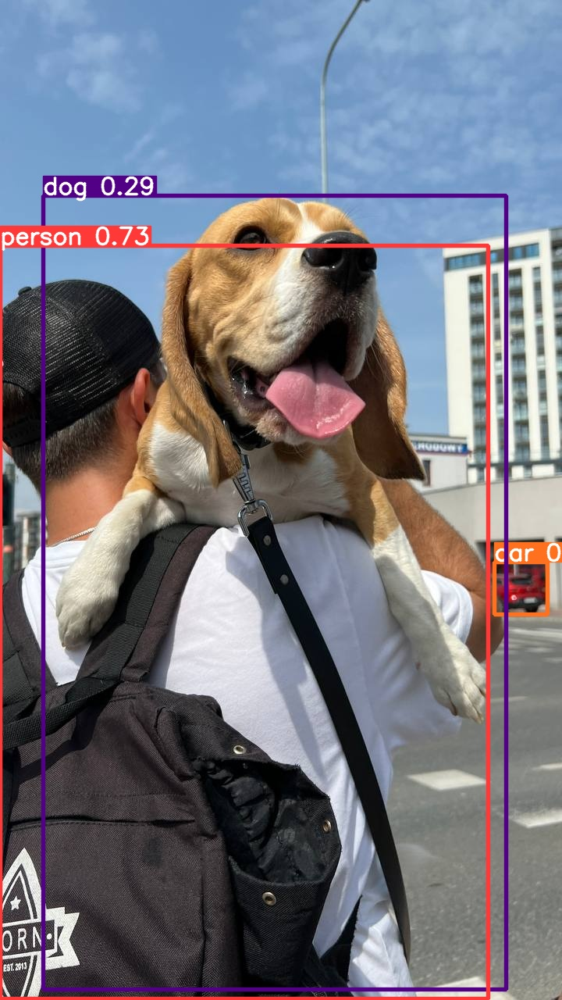

In [7]:
%cd {HOME}
Image(filename='runs/detect/predict/dog.jpeg', height=600)

### 🐍 Python SDK

The simplest way of simply using YOLOv8 directly in a Python environment.

In [8]:
model = YOLO(f'{HOME}/yolov8n.pt')
results = model.predict(source='https://media.roboflow.com/notebooks/examples/dog.jpeg', conf=0.25)


Found https://media.roboflow.com/notebooks/examples/dog.jpeg locally at dog.jpeg
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/1 /content/dog.jpeg: 640x384 1 person, 1 car, 1 dog, 250.8ms
Speed: 9.2ms preprocess, 250.8ms inference, 1086.5ms postprocess per image at shape (1, 3, 640, 384)


In [9]:
results[0].boxes.xyxy

tensor([[   0.0000,  314.4717,  625.0754, 1278.1946],
        [  55.1731,  250.0220,  648.1080, 1266.2720],
        [ 633.2291,  719.5391,  701.0538,  786.0336]], device='cuda:0')

In [10]:
results[0].boxes.conf

tensor([0.7271, 0.2907, 0.2846], device='cuda:0')

In [11]:
results[0].boxes.cls

tensor([ 0., 16.,  2.], device='cuda:0')

In [13]:
!mkdir {HOME}/datasets
%cd {HOME}/datasets

!pip install roboflow --quiet

from roboflow import Roboflow
rf = Roboflow(api_key="xC46IMviWWPuq9qhFq1m")
project = rf.workspace("yunnan-university").project("synthetic-fire-smoke")
version = project.version(17)
dataset = version.download("yolov8")

/content/datasets
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.0/72.0 kB 1.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 3.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 12.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 11.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 7.1 MB/s eta 0:00:00
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to synthetic-fire-smoke-17 in yolov8:: 100%|██████████| 7904/7904 [00:03<00:00, 2544.10it/s]


In [ ]:
# this is the YAML file Roboflow wrote for us that we're loading into this notebook with our data
%cat {dataset.location}/data.yaml

In [ ]:
# define number of classes based on YAML
import yaml
with open(dataset.location + "/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])
    print(dataset.location)
    print(num_classes)

## Custom Training

In [14]:
%cd {HOME}

!yolo task=detect mode=train model=yolov8s.pt data={dataset.location}/data.yaml epochs=25 imgsz=800 plots=True

/content
100% 21.5M/21.5M [00:00<00:00, 152MB/s]
New https://pypi.org/project/ultralytics/8.1.42 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/datasets/synthetic-fire-smoke-17/data.yaml, epochs=25, patience=50, batch=16, imgsz=800, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1,

In [15]:
!ls {HOME}/runs/detect/train/

args.yaml					    R_curve.png		 val_batch0_labels.jpg
confusion_matrix_normalized.png			    results.csv		 val_batch0_pred.jpg
confusion_matrix.png				    results.png		 val_batch1_labels.jpg
events.out.tfevents.1712083679.a978808b3640.5652.0  train_batch0.jpg	 val_batch1_pred.jpg
F1_curve.png					    train_batch1.jpg	 val_batch2_labels.jpg
labels_correlogram.jpg				    train_batch2640.jpg  val_batch2_pred.jpg
labels.jpg					    train_batch2641.jpg  weights
P_curve.png					    train_batch2642.jpg
PR_curve.png					    train_batch2.jpg


/content


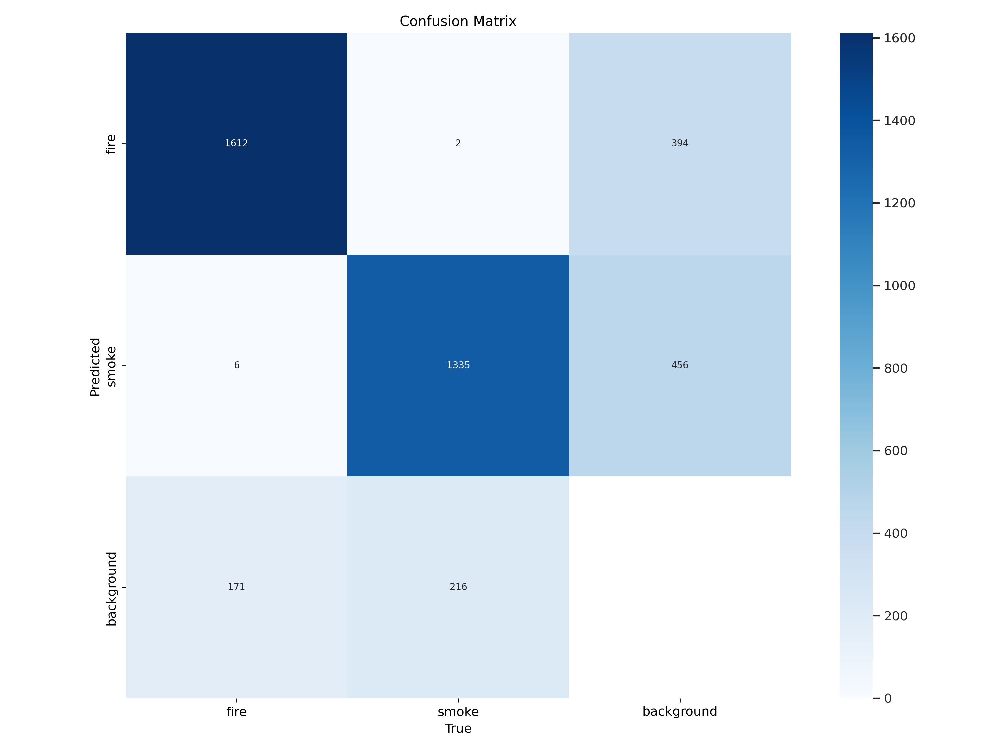

In [21]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/confusion_matrix.png', width=900)

/content


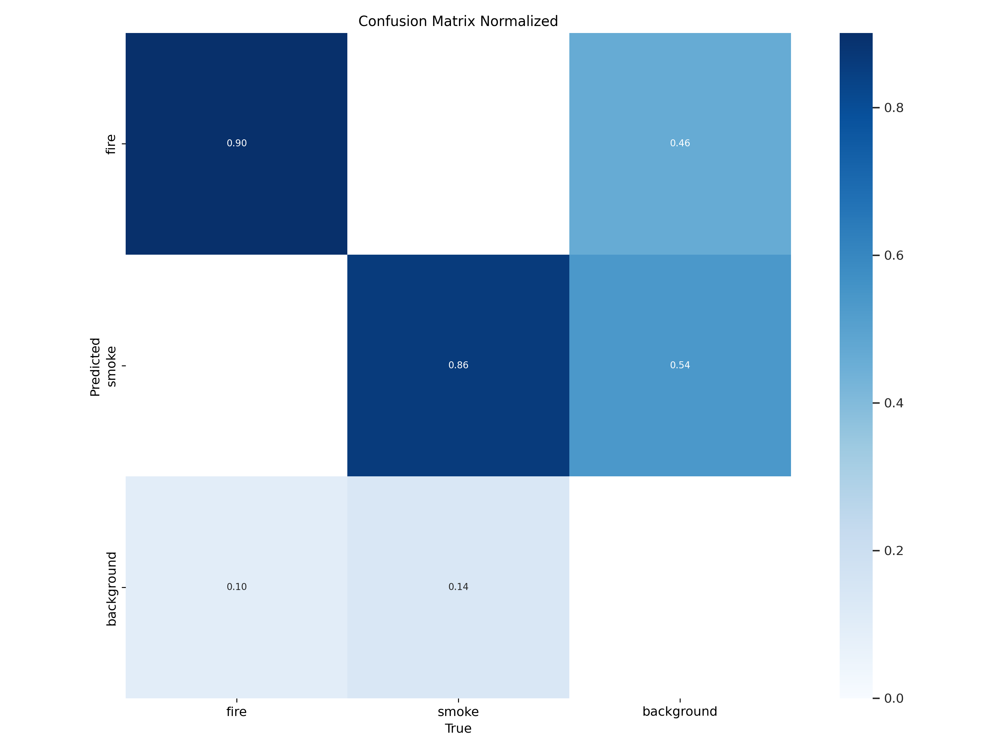

In [20]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/confusion_matrix_normalized.png', width=900)

/content


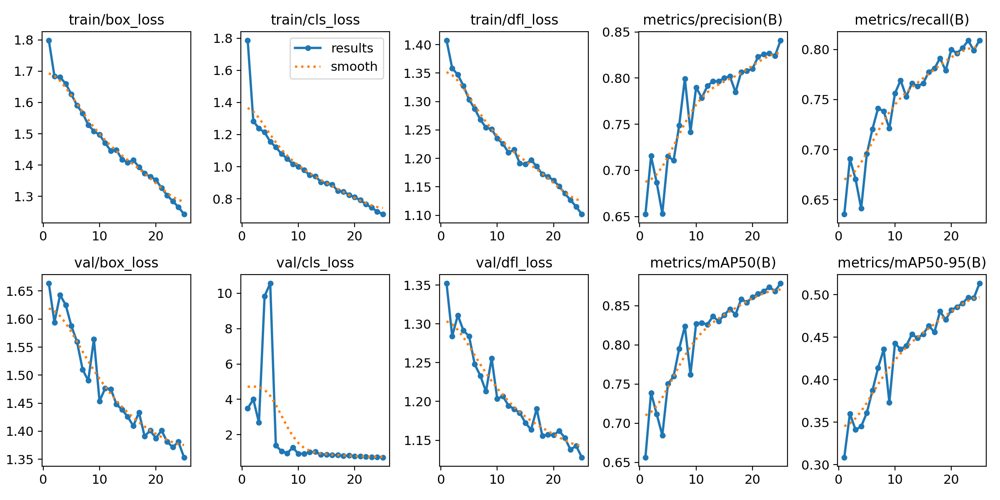

In [24]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/results.png', width=900)

/content


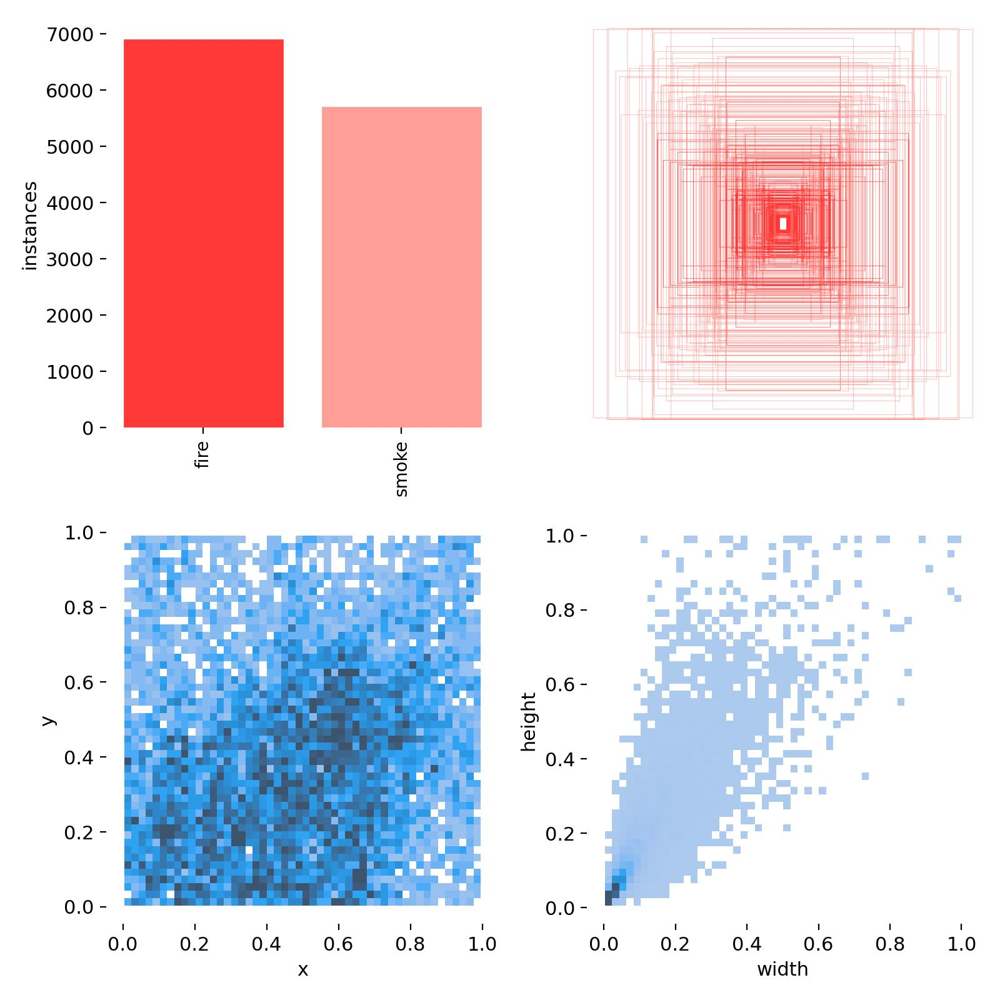

In [26]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/labels.jpg', width=900)

/content


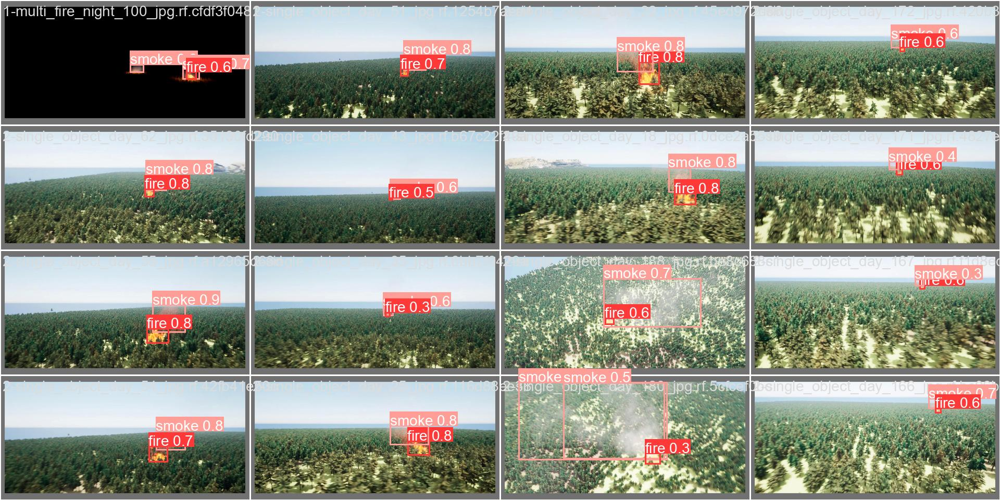

In [27]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/val_batch0_pred.jpg', width=900)

/content


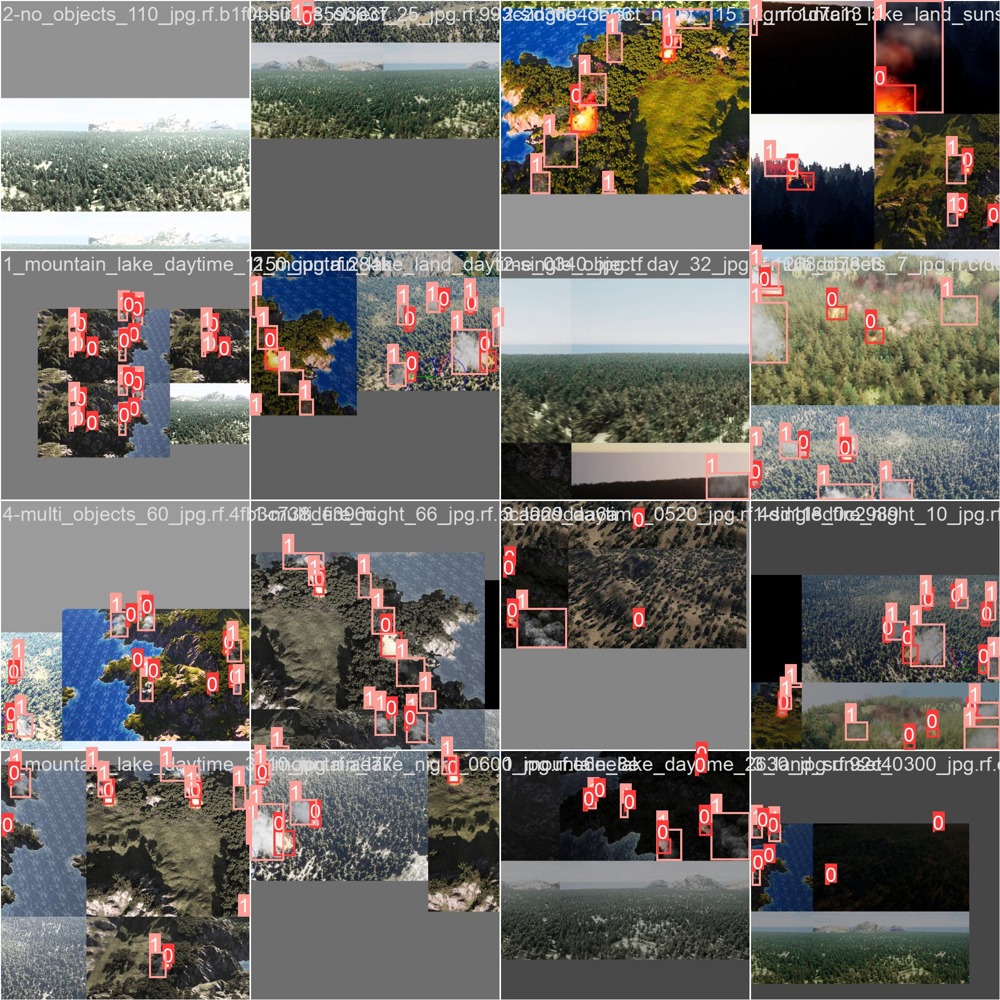

In [28]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/train_batch1.jpg', width=900)

/content


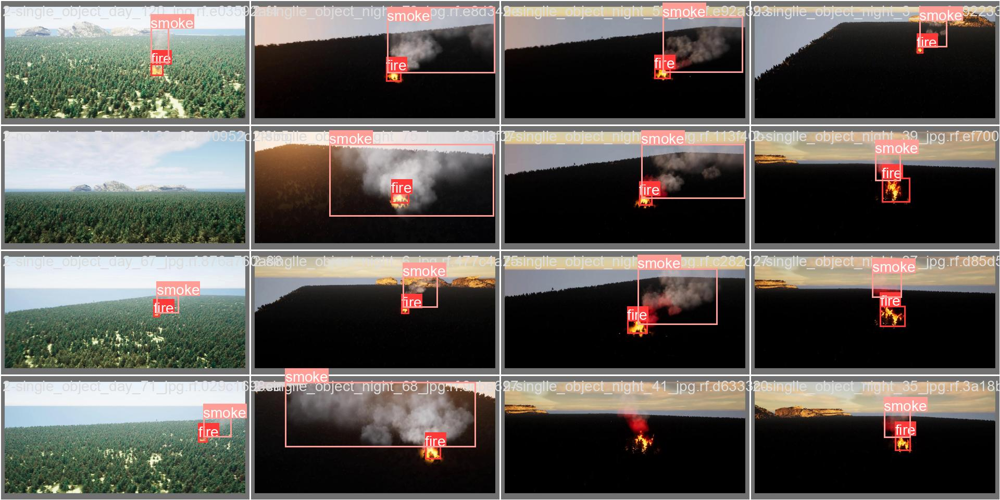

In [29]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/val_batch1_labels.jpg', width=900)

/content


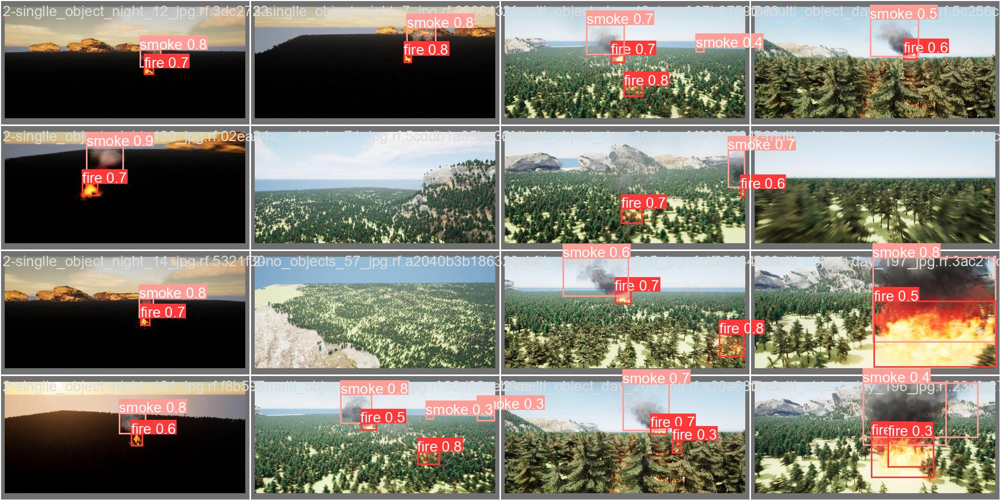

In [30]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/val_batch2_pred.jpg', width=900)

## Validate Custom Model

In [31]:
%cd {HOME}

!yolo task=detect mode=val model={HOME}/runs/detect/train/weights/best.pt data={dataset.location}/data.yaml

/content
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11126358 parameters, 0 gradients, 28.4 GFLOPs
val: Scanning /content/datasets/synthetic-fire-smoke-17/valid/labels.cache... 759 images, 100 backgrounds, 0 corrupt: 100% 759/759 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 48/48 [00:16<00:00,  2.98it/s]
                   all        759       3342      0.842      0.808      0.878      0.514
                  fire        759       1789      0.854      0.821      0.881      0.475
                 smoke        759       1553      0.829      0.795      0.875      0.553
Speed: 0.6ms preprocess, 7.7ms inference, 0.0ms loss, 2.5ms postprocess per image
Results saved to runs/detect/val
💡 Learn more at https://docs.ultralytics.com/modes/val


## Inference with Custom Model

In [32]:
%cd {HOME}
!yolo task=detect mode=predict model={HOME}/runs/detect/train/weights/best.pt conf=0.25 source={dataset.location}/test/images save=True

/content
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11126358 parameters, 0 gradients, 28.4 GFLOPs

WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/385 /content/datasets/synthetic-fire-smoke-17/test/images/1-multi_fire_night_102_jpg.rf.46b662169b385574cdc2e5e5f7451b43.jpg: 384x800 1 fire, 2 smokes, 103.2ms
image 2/385 /content/datasets/synthetic-fire-smoke-17/test/images/1-multi_fire_night_105_jpg.rf.84be5979313f83a72a94b92375bdab4f.jpg: 384x800 1 fire, 2 smokes, 13.6ms
image 3/385 /content/datasets/synthetic-fire-smoke-17/test/images/1-multi_fire_night_106_jpg.rf.868e0707cae12aa52b2b8ca452a0732e.jpg: 384x800 1 fire, 2 smokes, 13.5ms
image 4/385 /content/datasets/synthetic-fire-smoke-17/test/images/1-multi_fire_night_114_jpg.rf.37d8ea519256ef06ff0e9da98f3d2d33.jpg: 384x800 3 fires, 4 smokes, 13.5ms
image 5/385 /content/datasets/synthetic-fire-smoke-17/test/images/1-multi_fire_night_11_jpg.rf.962f4a1aebebde

## inference on video mp4

In [33]:
%cd {HOME}
!yolo task=detect mode=predict model={HOME}/runs/detect/train/weights/best.pt conf=0.25 source=/content/fire.mp4 save=True

/content
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11126358 parameters, 0 gradients, 28.4 GFLOPs

video 1/1 (1/475) /content/fire.mp4: 480x800 2 fires, 103.8ms
video 1/1 (2/475) /content/fire.mp4: 480x800 2 fires, 15.7ms
video 1/1 (3/475) /content/fire.mp4: 480x800 2 fires, 15.6ms
video 1/1 (4/475) /content/fire.mp4: 480x800 2 fires, 15.6ms
video 1/1 (5/475) /content/fire.mp4: 480x800 2 fires, 15.5ms
video 1/1 (6/475) /content/fire.mp4: 480x800 3 fires, 15.5ms
video 1/1 (7/475) /content/fire.mp4: 480x800 3 fires, 15.5ms
video 1/1 (8/475) /content/fire.mp4: 480x800 2 fires, 15.6ms
video 1/1 (9/475) /content/fire.mp4: 480x800 2 fires, 15.5ms
video 1/1 (10/475) /content/fire.mp4: 480x800 2 fires, 10.7ms
video 1/1 (11/475) /content/fire.mp4: 480x800 2 fires, 10.6ms
video 1/1 (12/475) /content/fire.mp4: 480x800 2 fires, 10.6ms
video 1/1 (13/475) /content/fire.mp4: 480x800 2 fires, 10.6ms
video 1/1 (14/475) /con

**NOTE:** Let's take a look at few results.

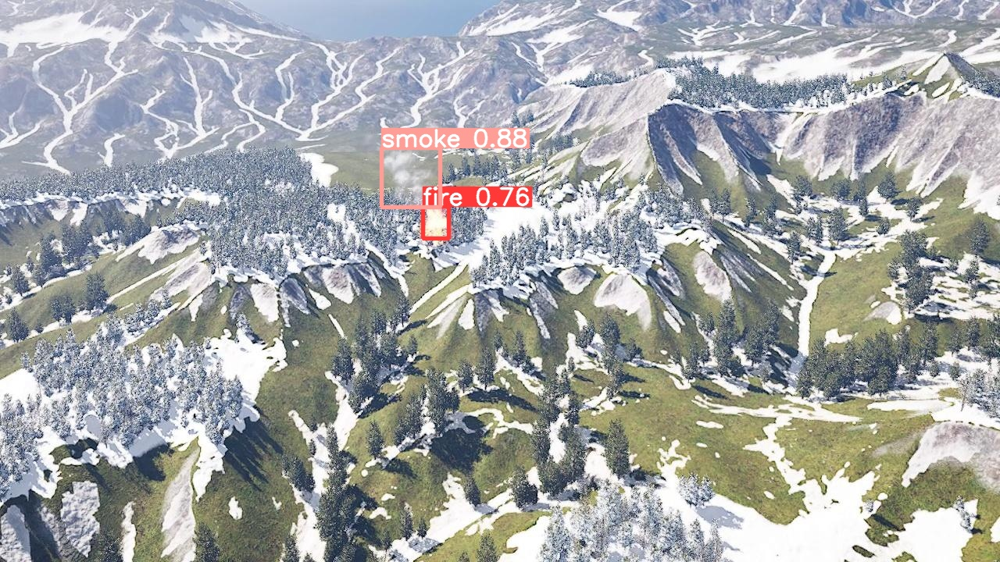

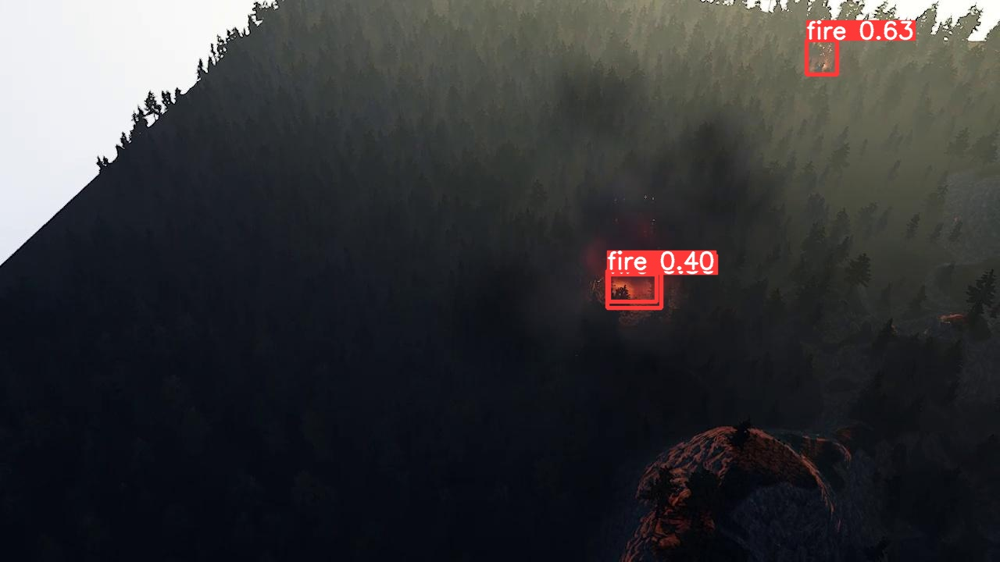

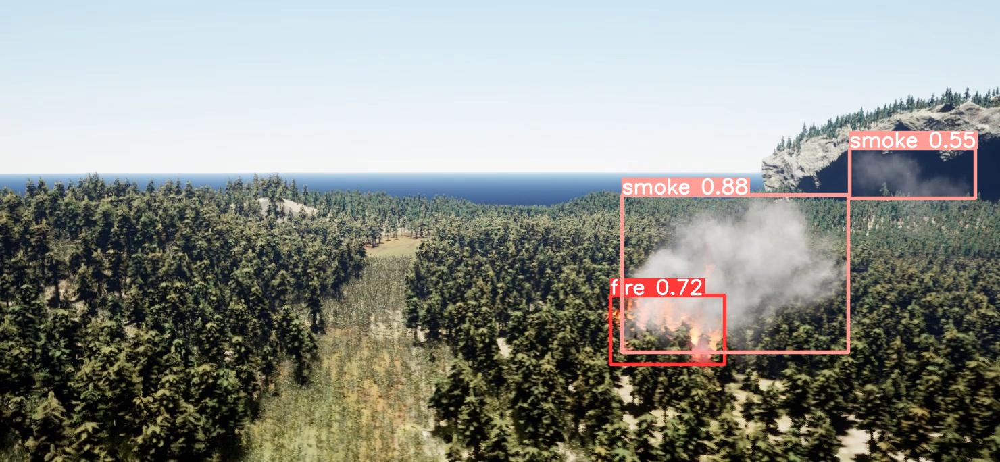

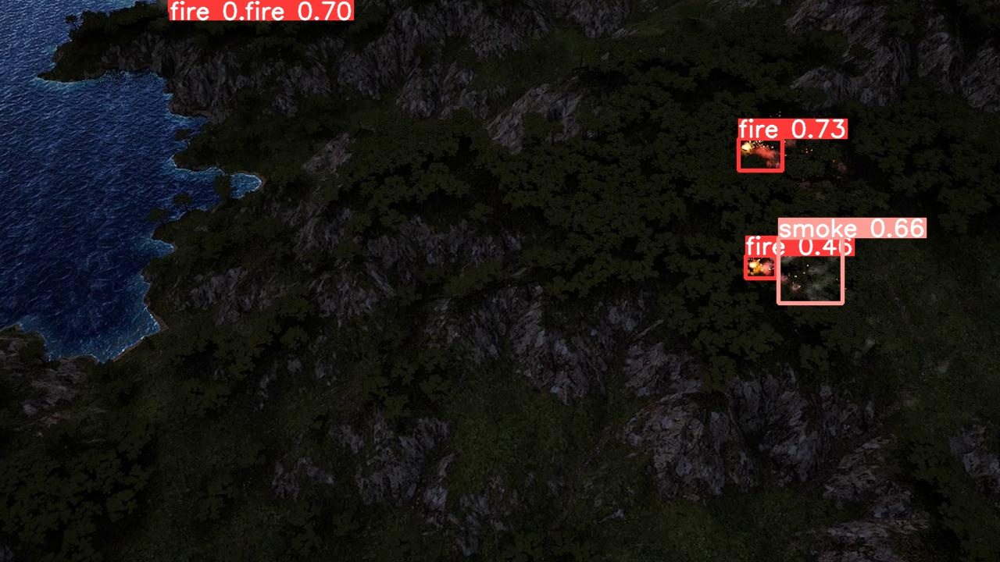

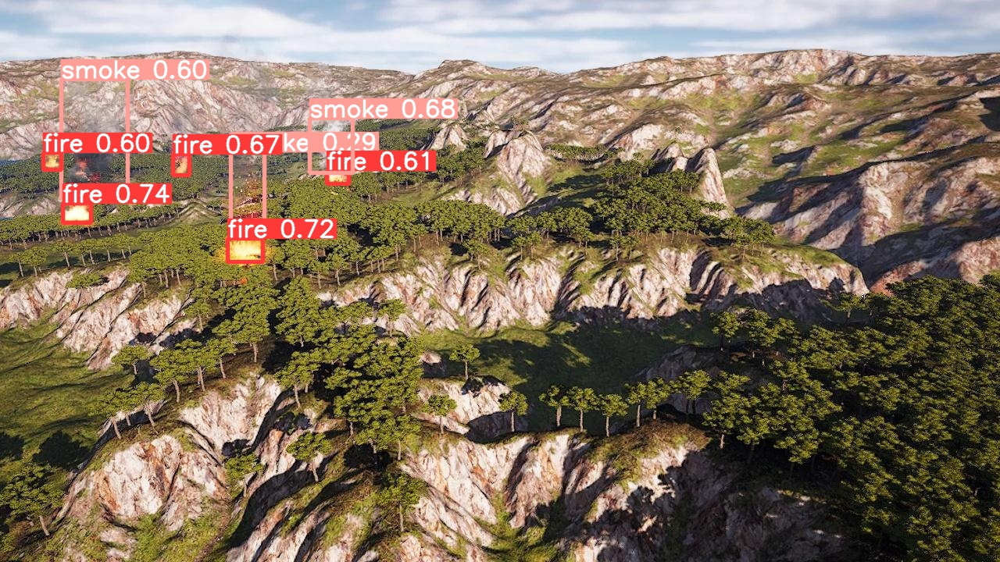

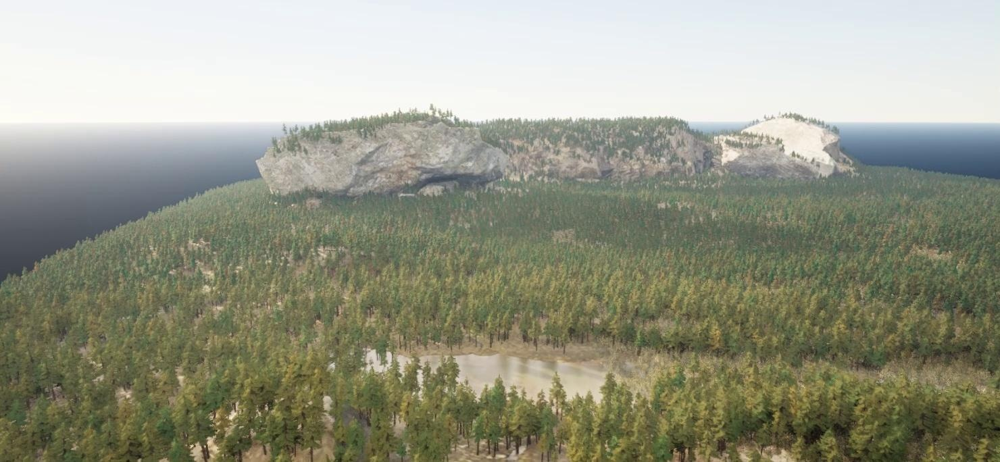

In [34]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/runs/detect/predict2/*.jpg')[:6]:
      display(Image(filename=image_path, width=900))
      print("\n")

In [35]:
# nc: 2 # number of classes
# scales: # model compound scaling constants, i.e. 'model=yolov8n.yaml' will call yolov8.yaml with scale 'n'
#   # [depth, width, max_channels]
#   n: [0.33, 0.25, 1024] # YOLOv8n summary: 225 layers,  3157200 parameters,  3157184 gradients,   8.9 GFLOPs
#   s: [0.33, 0.50, 1024] # YOLOv8s summary: 225 layers, 11166560 parameters, 11166544 gradients,  28.8 GFLOPs
#   m: [0.67, 0.75, 768] # YOLOv8m summary: 295 layers, 25902640 parameters, 25902624 gradients,  79.3 GFLOPs
#   l: [1.00, 1.00, 512] # YOLOv8l summary: 365 layers, 43691520 parameters, 43691504 gradients, 165.7 GFLOPs
#   x: [1.00, 1.25, 512] # YOLOv8x summary: 365 layers, 68229648 parameters, 68229632 gradients, 258.5 GFLOPs

# # YOLOv8s backbone
# backbone:
#   # [from, repeats, module, args]
#   - [-1, 1, Conv, [32, 3, 2]] # 0-P1/2
#   - [-1, 1, Conv, [64, 3, 2]] # 1-P2/4
#   - [-1, 3, C2f, [64, true]]
#   - [-1, 1, Conv, [128, 3, 2]] # 3-P3/8
#   - [-1, 6, C2f, [128, true]]
#   - [-1, 1, Conv, [256, 3, 2]] # 5-P4/16
#   - [-1, 6, C2f, [256, true]]
#   - [-1, 1, Conv, [512, 3, 2]] # 7-P5/32
#   - [-1, 3, C2f, [512, true]]
#   - [-1, 1, SPPF, [512, 5]] # 9

# # YOLOv8s head
# head:
#   - [-1, 1, nn.Upsample, [none, 2, "nearest"]]
#   - [[-1, 6], 1, Concat, [1]] # cat backbone P4
#   - [-1, 3, C2f, [256]] # 12

#   - [-1, 1, nn.Upsample, [none, 2, "nearest"]]
#   - [[-1, 4], 1, Concat, [1]] # cat backbone P3
#   - [-1, 3, C2f, [128]] # 15 (P3/8-small)

#   - [-1, 1, Conv, [128, 3, 2]]
#   - [[-1, 12], 1, Concat, [1]] # cat head P4
#   - [-1, 3, C2f, [256]] # 18 (P4/16-medium)

#   - [-1, 1, Conv, [256, 3, 2]]
#   - [[-1, 9], 1, Concat, [1]] # cat head P5
#   - [-1, 3, C2f, [1024]] # 21 (P5/32-large)

#   - [[15, 18, 21], 1, Detect, [nc]] # Detect(P3, P4, P5)

## Tensorboard logging

In [36]:
# Start tensorboard (optional)
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

##  Export Trained Weights for Future Inference

In [ ]:
# Delete long/unncessary and dataset directories in Google Colab
!rm -r /content/yolov5/models/segment

In [37]:
import google.oauth2.credentials

In [38]:
from google.colab import auth
auth.authenticate_user()

In [39]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [40]:
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [41]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Specify the path of your custom directory in Google Drive
custom_directory_path = '/content/runs'

# Zip the custom directory
import shutil
shutil.make_archive('/content/yolov8_fireandsmoke_final', 'zip', custom_directory_path)

# Download the zipped file to your local machine
from google.colab import files
files.download('/content/yolov8_fireandsmoke_final.zip')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>